In [ ]:
# Import Packages and Datasets
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

full_df = pd.read_csv('https://github.com/neurogaussthm/MATH4463_CS4432_Data/raw/main/polymer_reactor.txt', names=['DateTime', 'C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp', 'MFR'], header=0)
full_df.dropna(inplace=True)
full_df['lnMFR'] = np.log(full_df['MFR'].values)
del full_df['DateTime']
full_df.head()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4,1.223775
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2,1.163151
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2,1.163151
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1,1.131402
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3,1.193922


# i. Exploratory Data Analysis and Preprocessing

In [ ]:
try:
  from ydata_profiling import ProfileReport
except:
  !pip install ydata_profiling
  print('Dependencies installed. Please restart the session before proceeding.')

In [ ]:
# The previous cell must be executed first (and the session may require a restart)
# This cell takes about a couple of minutes to execute
ProfileReport(full_df, explorative=True, minimal=False).to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:524: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

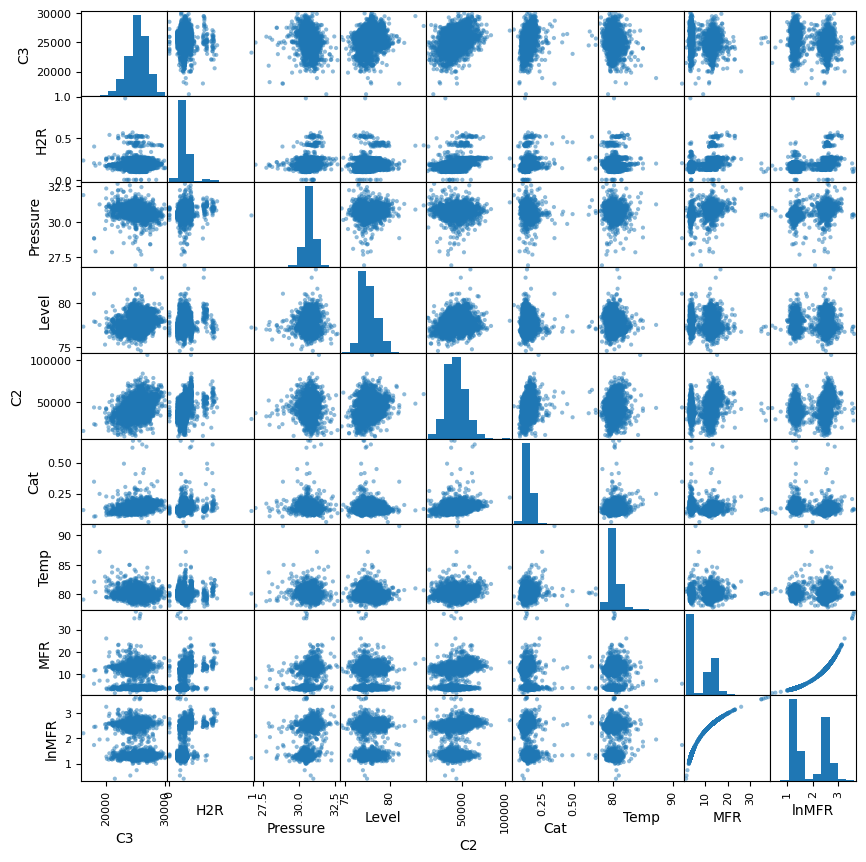

In [ ]:
pd.plotting.scatter_matrix(full_df, figsize=(10, 10))
plt.show()

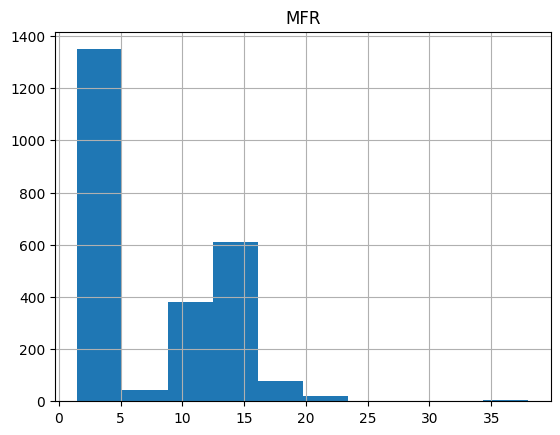

In [ ]:
full_df.hist('MFR', bins=10)
plt.show()

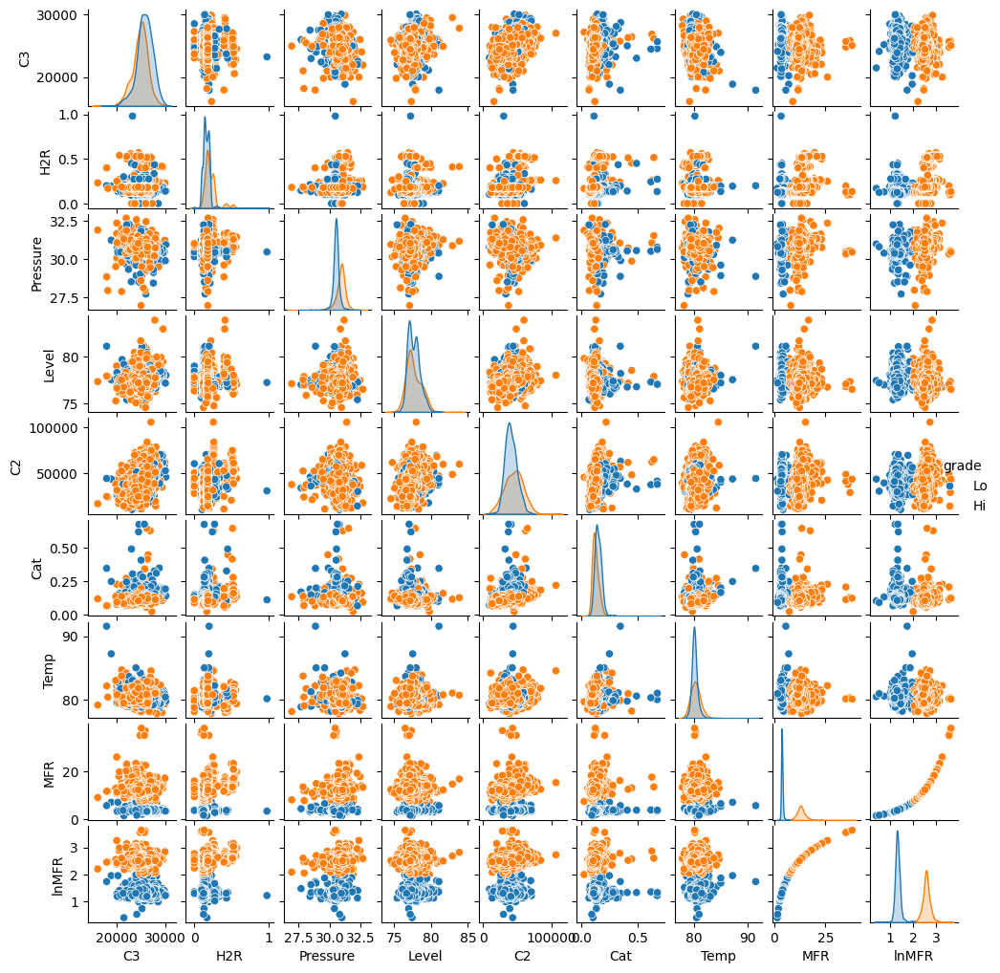

In [ ]:
dpair = full_df.copy()
dpair['grade'] = np.where(dpair['lnMFR'].values < 2, 'Lo', 'Hi')
g = sns.pairplot(dpair, hue='grade')
g.fig.set_size_inches(10,10)
plt.show()

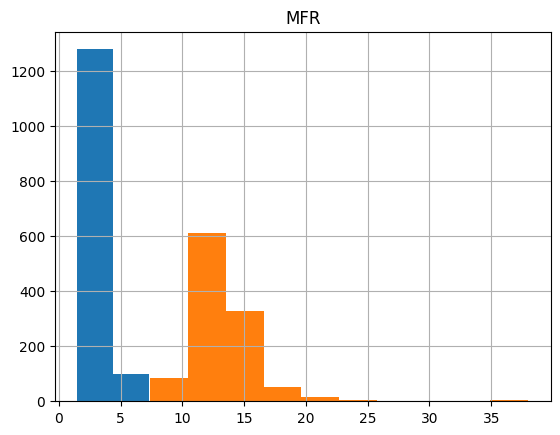

In [ ]:
ax = dpair[dpair['grade'] == 'Lo'].hist('MFR', bins=2)
dpair[dpair['grade'] == 'Hi'].hist('MFR', ax=ax, bins=10)
plt.show()

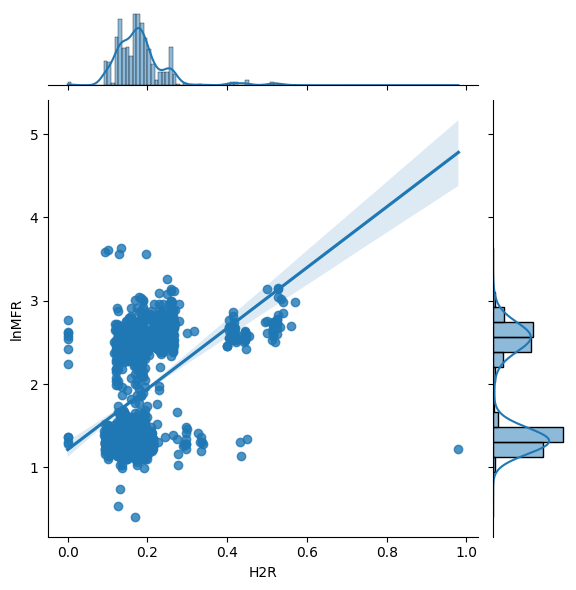

In [ ]:
sns.jointplot(full_df, x='H2R', y='lnMFR', kind="reg")
plt.show()

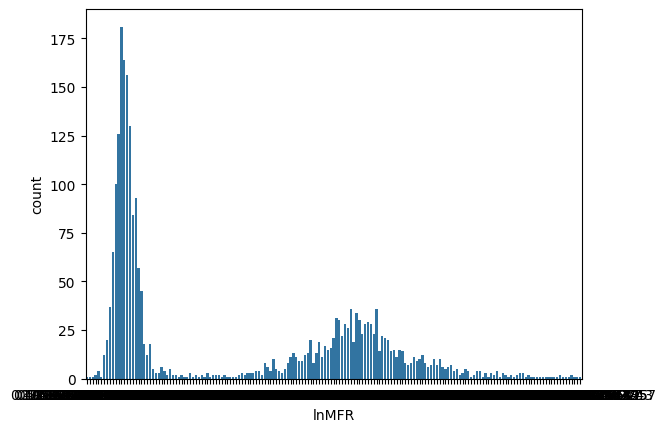

In [ ]:
sns.countplot(x=full_df['lnMFR'])
plt.show()

In [ ]:
full_df.corr(numeric_only=True).style.background_gradient(cmap='coolwarm')

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR
C3,1.000000,-0.035833,-0.246382,0.207590,0.387429,0.279968,-0.157591,-0.247984,-0.258358
H2R,-0.035833,1.000000,0.221576,0.104436,0.375745,0.226919,0.052967,0.426433,0.413058
Pressure,-0.246382,0.221576,1.000000,0.044294,0.064547,-0.152372,-0.036286,0.438837,0.448031
Level,0.207590,0.104436,0.044294,1.000000,0.289986,0.000157,-0.084688,-0.006452,0.003313
C2,0.387429,0.375745,0.064547,0.289986,1.000000,0.246106,0.116090,0.233219,0.216502
Cat,0.279968,0.226919,-0.152372,0.000157,0.246106,1.000000,0.103214,-0.209013,-0.239157
Temp,-0.157591,0.052967,-0.036286,-0.084688,0.116090,0.103214,1.000000,0.125628,0.125574
MFR,-0.247984,0.426433,0.438837,-0.006452,0.233219,-0.209013,0.125628,1.000000,0.979901
lnMFR,-0.258358,0.413058,0.448031,0.003313,0.216502,-0.239157,0.125574,0.979901,1.000000


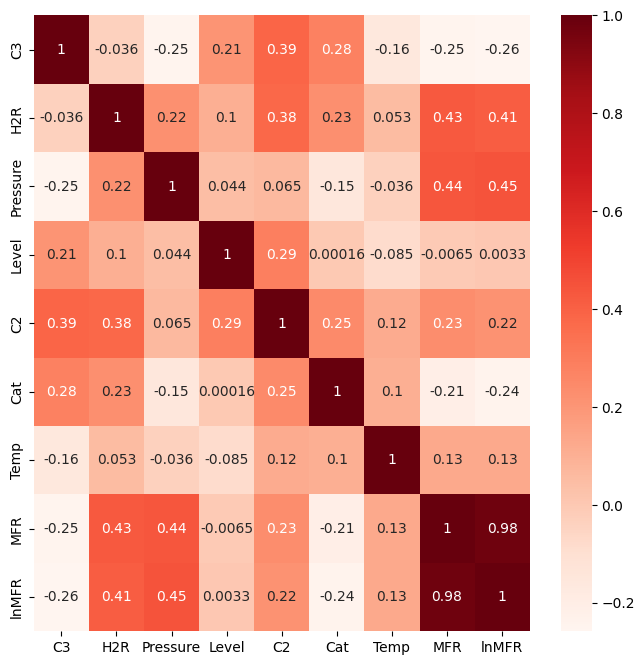

In [ ]:
plt.figure(figsize=(8, 8))
sns.heatmap(full_df.corr(numeric_only=True), annot=True, cmap=plt.cm.Reds)
plt.show()

# ii. Feature Engineering/Selection

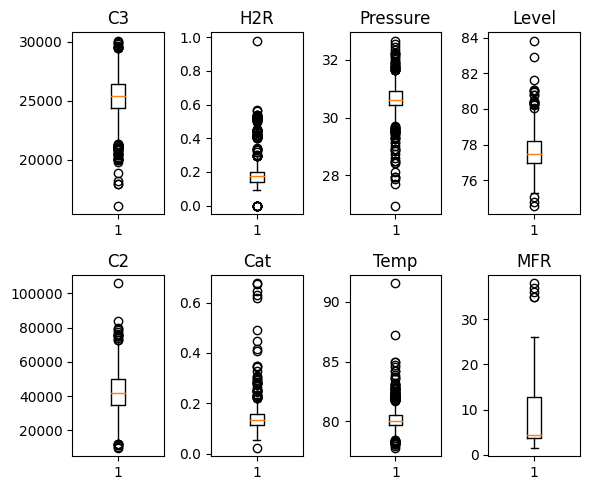

In [ ]:
plt.figure(figsize=(6, 5))
for i, c in enumerate(full_df.columns[0:-1]):
    plt.subplot(2, 4, i+1)
    plt.title(c)
    plt.boxplot(full_df[c])
plt.tight_layout()
plt.show()

In [ ]:
# Removes potential outliers
# However, a knowledgeable expert of polymer production should be consulted
# for greater understanding of these potential outliers.
full_df = full_df.loc[full_df['MFR'] < 30]
full_df = full_df.loc[(full_df['H2R'] < 0.7) & (full_df['H2R'] > 0.01)]
full_df = full_df.loc[full_df['C2'] < 100_000]
full_df = full_df.loc[full_df['Temp'] < 86]

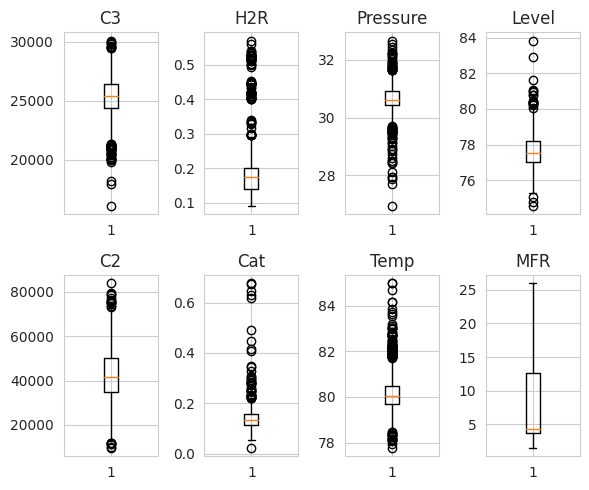

In [ ]:
plt.figure(figsize=(6, 5))
for i, c in enumerate(full_df.columns[0:-1]):
    plt.subplot(2, 4, i+1)
    plt.title(c)
    plt.boxplot(full_df[c])
plt.tight_layout()
plt.show()

In [ ]:
del full_df['MFR']
full_df.head()

,C3,H2R,Pressure,Level,C2,Cat,Temp,lnMFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,1.223775
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,1.163151
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,1.163151
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,1.131402
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,1.193922


In [ ]:
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(full_df)
ds = pd.DataFrame(ds, columns=full_df.columns)
ds.head()

,C3,H2R,Pressure,Level,C2,Cat,Temp,lnMFR
0,-0.267722,-0.450321,-0.590237,2.185164,0.738478,0.612474,0.340288,-1.034155
1,0.133386,-0.450321,-0.324407,0.959531,-0.025804,-0.209650,-1.649118,-1.130084
2,0.222967,-0.450321,-0.729100,1.297202,0.249565,0.276673,-1.705004,-1.130084
3,-0.125014,-0.450321,0.544888,1.657567,0.049306,0.313642,-1.440394,-1.180321
4,-0.269279,-0.493499,0.039058,1.117123,-0.187639,-0.381423,-1.420009,-1.081392


# iii. Regression Model(s)

# iv. Training and Testing of the Model(s)

In [ ]:
# `random_state=42` for reproducibility
train, test = train_test_split(ds, test_size=0.2, shuffle=True, random_state=42)
print(len(train),len(test))

1971 493


Slope, Intercept: [4.0715357  1.12699813]


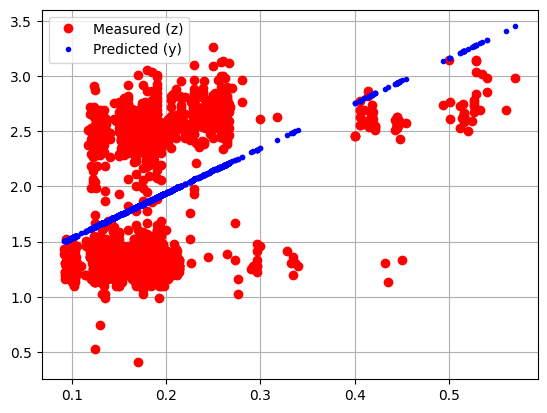

In [ ]:
x = full_df['H2R'].values
z = full_df['lnMFR'].values
p1 = np.polyfit(x, z, 1)
print('Slope, Intercept: ' + str(p1))

plt.plot(x, z, 'ro', label='Measured (z)')
plt.plot(x, np.polyval(p1, x), 'b.', label='Predicted (y)')
plt.legend()
plt.grid()
plt.show()

In [ ]:
X = full_df[full_df.columns[0:-1]]
y = full_df[full_df.columns[-1]]

In [ ]:
import statsmodels.api as sm
xc = sm.add_constant(X)
model = sm.OLS(y, xc).fit()
predictions = model.predict(xc)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lnMFR   R-squared:                       0.458
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     296.7
Date:                Sun, 24 Mar 2024   Prob (F-statistic):          3.54e-321
Time:                        23:23:42   Log-Likelihood:                -1610.6
No. Observations:                2464   AIC:                             3237.
Df Residuals:                    2456   BIC:                             3284.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.9767      1.621     -8.004      0.000     -16.156      -9.797
C3         -5.203e-05   6.78e-06     -7.671      0.000   -6.53e-05   -3.87e-05
H2R            3.4083      0.158     21.602      0.000       3.099       3.718
Pressure       0.4170      0.024     17.300      0.000       0.370       0.464
Level         -0.0429      0.011     -3.917      0.000      -0.064      -0.021
C2          1.066e-05   1.06e-06     10.093      0.000    8.59e-06    1.27e-05
Cat           -4.5664      0.249    -18.333      0.000      -5.055      -4.078
Temp           0.0782      0.013      6.184      0.000       0.053       0.103
==============================================================================
Omnibus:                       60.235   Durbin-Watson:                   0.520
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               65.851
Skew:                           0.361   Prob(JB):                     5.02e-15
Kurtosis:                       3.348   Cond. No.                     8.72e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.72e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

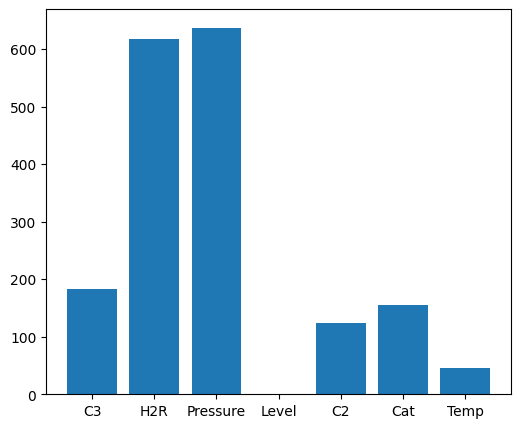

In [ ]:
# `H2R` and `Pressure` seem to have the greatest potential impact on the MFR
# The `Temp` range is rather short, which affects its apparent predictibility
from sklearn.feature_selection import SelectKBest, f_regression
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(X, y)
plt.figure(figsize=(6, 5))
plt.bar(x = X.columns, height=fit.scores_)
plt.show()

# v. Evaluation and Comparison of the Models

In [ ]:
def fit(method):
    # create points for plotting surface
    xp = np.arange(-5, 5, 0.2)
    yp = np.arange(-5, 5, 0.2)
    XP, YP = np.meshgrid(xp, yp)

    model = method.fit(train[['H2R','Pressure']], train['lnMFR'])
    zp = method.predict(np.vstack((XP.flatten(), YP.flatten())).T)
    ZP = zp.reshape(np.size(XP,0),np.size(XP,1))

    r2 = method.score(test[['H2R','Pressure']], test['lnMFR'])
    print('R^2: ' + str(r2))

    fig = plt.figure(figsize=(7, 7))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(ds['H2R'], ds['Pressure'], ds['lnMFR'], c=z, cmap='plasma', label='data')
    ax.plot_surface(XP, YP, ZP, cmap='coolwarm', alpha=0.7, linewidth=0, antialiased=False)

    ax.set_title(f'{type(method).__name__} predicted and actual MFR')
    ax.set_xlabel('H2R     ')
    ax.set_ylabel('Pressure')
    ax.set_zlabel('MFR     ')

    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


R^2: 0.30986491680589157


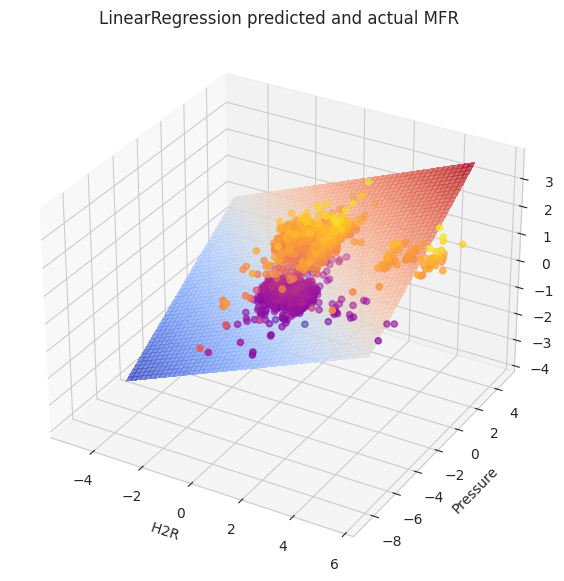

In [ ]:
from sklearn import linear_model
fit(linear_model.LinearRegression())

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but Ridge was fitted with feature names
  warnings.warn(


R^2: 0.30988235231781736


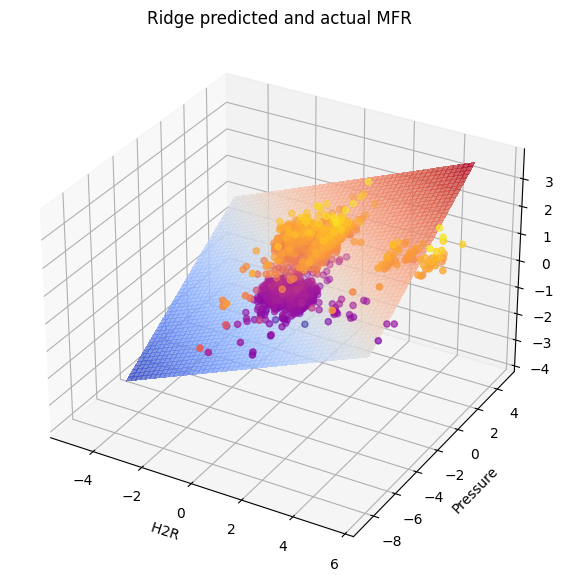

In [ ]:
from sklearn import linear_model
fit(linear_model.Ridge())

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but Lasso was fitted with feature names
  warnings.warn(


R^2: 0.3016457619948514


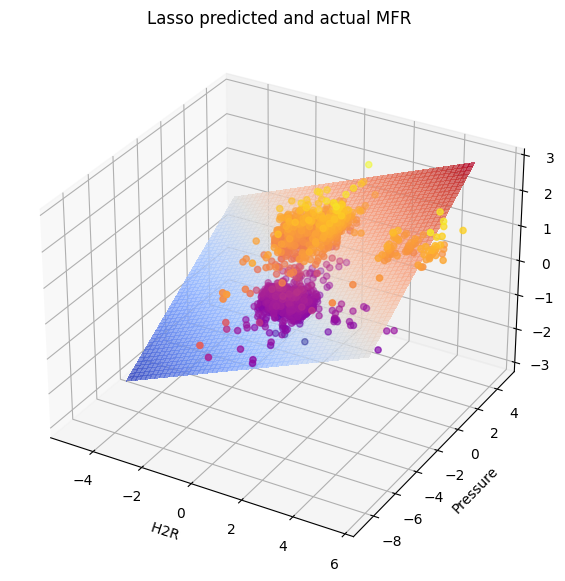

In [ ]:
from sklearn import linear_model
fit(linear_model.Lasso(alpha = 0.1))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RadiusNeighborsRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_regression.py:494: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


R^2: 0.34926841924353236


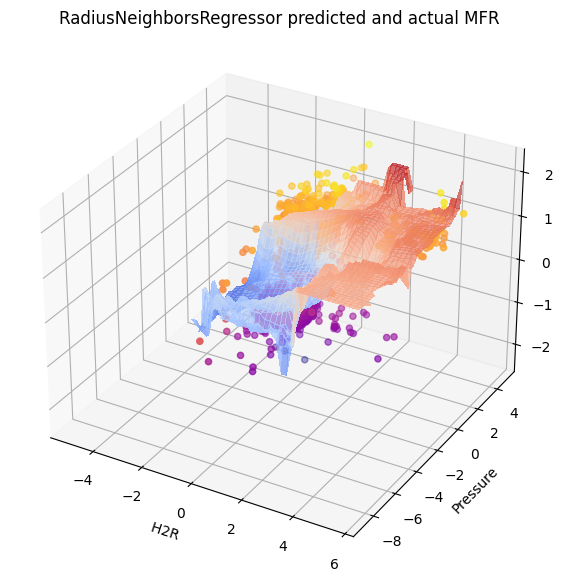

In [ ]:
from sklearn.neighbors import RadiusNeighborsRegressor
fit(RadiusNeighborsRegressor(radius=1.5))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


R^2: 0.6045319821107229


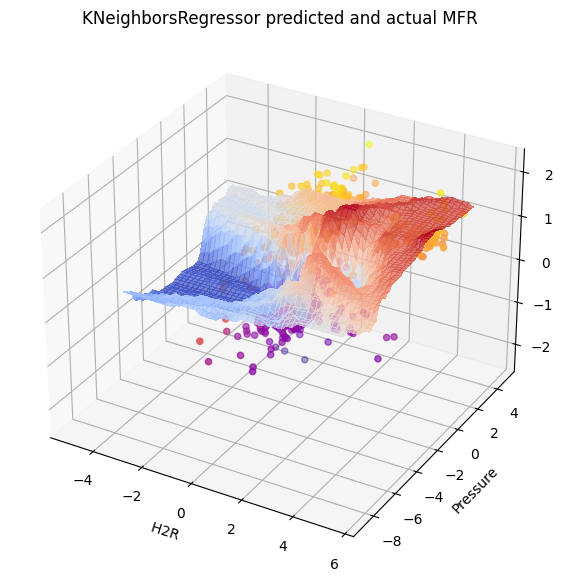

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
fit(KNeighborsRegressor(n_neighbors=20))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


R^2: 0.5954085309143569


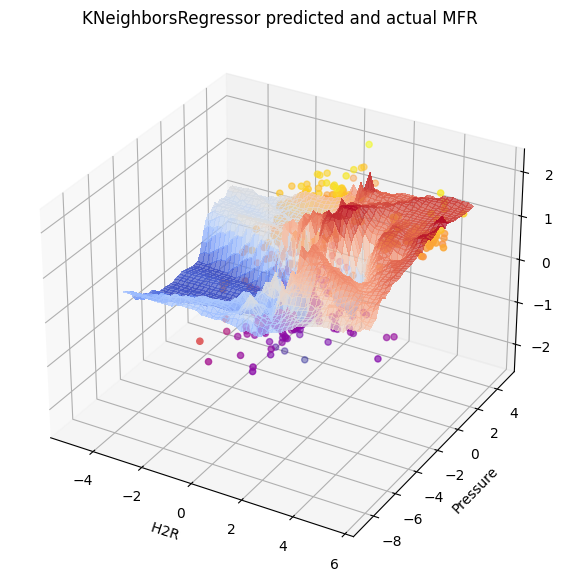

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
fit(KNeighborsRegressor(n_neighbors=20, weights='distance'))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


R^2: 0.540247493941576


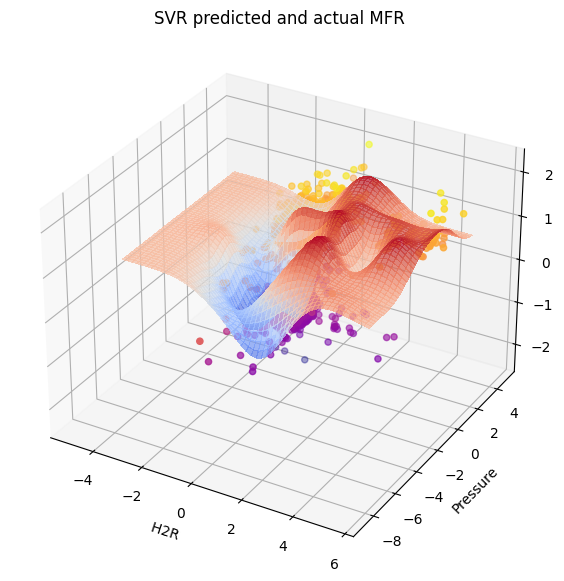

In [ ]:
from sklearn import svm
fit(svm.SVR())

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but NuSVR was fitted with feature names
  warnings.warn(


R^2: 0.5519255393171243


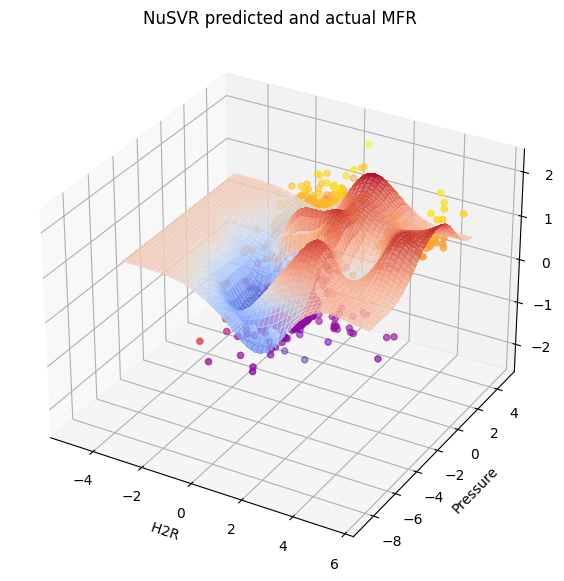

In [ ]:
from sklearn import svm
fit(svm.NuSVR())

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearSVR was fitted with feature names
  warnings.warn(


R^2: 0.21127835749335022


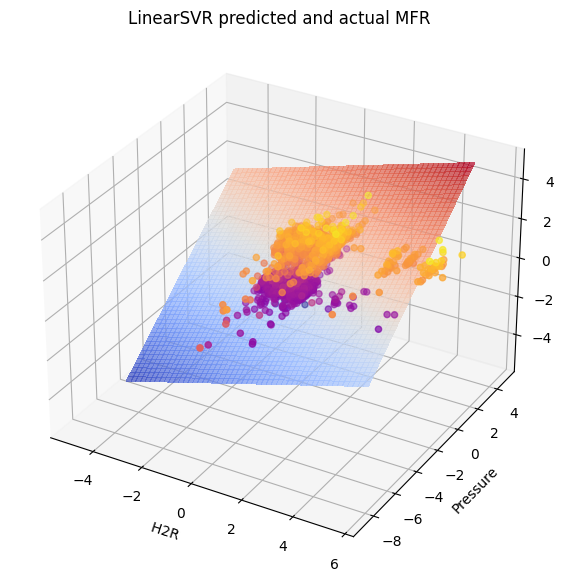

In [ ]:
from sklearn import svm
fit(svm.LinearSVR())

In [ ]:
def fitn(method):
    f = train.columns
    model = method.fit(train[f[0:-1]], train['lnMFR'])

    r2 = method.score(test[f[0:-1]], test['lnMFR'])
    print('R^2: ' + str(r2))

    MFR_pred = method.predict(test[f[0:-1]])

    plt.plot(test['lnMFR'],MFR_pred,'b.')
    plt.plot([-1,2], [-1,2], 'k-')

R^2: 0.4509274390503135


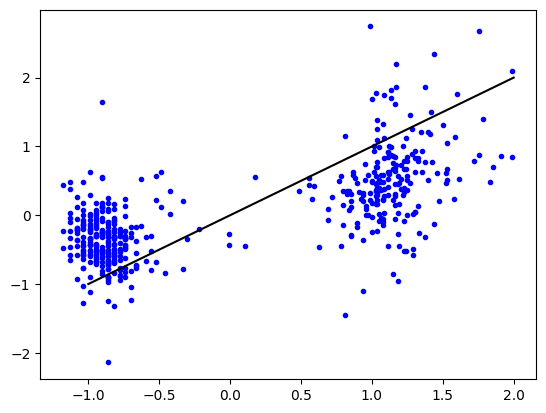

In [ ]:
fitn(linear_model.LinearRegression())

R^2: 0.7150160148297766


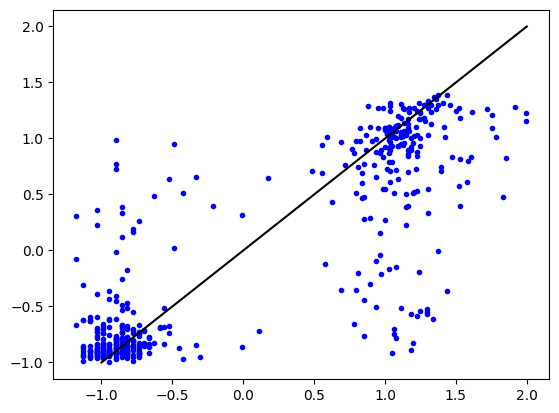

In [ ]:
fitn(KNeighborsRegressor(n_neighbors=20))

R^2: 0.7574552417133291


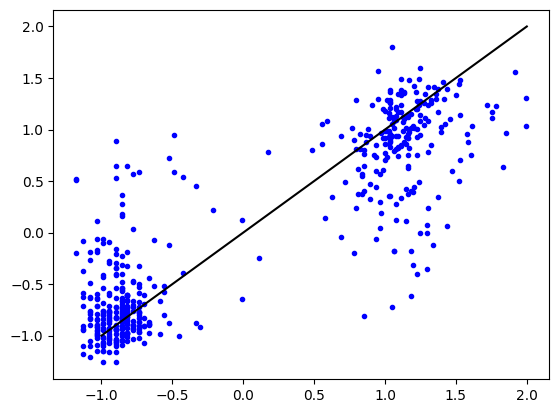

In [ ]:
fitn(svm.SVR(gamma='scale'))

In [ ]:
def average_scores(method):
    ITERATIONS = 1000
    r2_test_sum = 0
    r2_train_sum = 0
    mse_sum = 0
    X = ds[ds.columns[0:-1]]
    y = ds[ds.columns[-1]]
    for i in range(ITERATIONS):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
        model = method.fit(X_train, y_train)
        r2_test_sum += method.score(X_test, y_test)
        r2_train_sum += method.score(X_train, y_train)
        mse_sum += mean_squared_error(y_test, model.predict(X_test), squared=False)
    print(f'Average Test R^2: {r2_test_sum/ITERATIONS}')
    print(f'Average Train R^2: {r2_train_sum/ITERATIONS}')
    print(f'Average MSE: {mse_sum/ITERATIONS}')

In [ ]:
from sklearn import linear_model
average_scores(linear_model.LinearRegression())

Average Test R^2: 0.44832408722648276
Average Train R^2: 0.4590735928668418
Average MSE: 0.7411621926387255


In [ ]:
from sklearn import linear_model
average_scores(linear_model.Ridge())

Average Test R^2: 0.44834056044092124
Average Train R^2: 0.45907349901866057
Average MSE: 0.7411520496698772


In [ ]:
from sklearn import linear_model
average_scores(linear_model.Lasso(alpha = 0.1))

Average Test R^2: 0.397410744379078
Average Train R^2: 0.4034128969969999
Average MSE: 0.7749490317484464


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
average_scores(KNeighborsRegressor(n_neighbors=20))

Average Test R^2: 0.7319500510271216
Average Train R^2: 0.7575336215377156
Average MSE: 0.5162569047801174


In [ ]:
# 6 minutes to run
from sklearn import svm
average_scores(svm.SVR())

Average Test R^2: 0.7555407909551436
Average Train R^2: 0.8088337120564596
Average MSE: 0.49305798418402996


In [ ]:
from sklearn import svm
average_scores(svm.NuSVR())

Average Test R^2: 0.7563755650304173
Average Train R^2: 0.8085154560825938
Average MSE: 0.4922481786650607
